In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

input_dir = r"C:\Users\xiaoh\OneDrive\Desktop\Final_morphogenesis\05_shared_data\input"
output_dir = r"C:\Users\xiaoh\OneDrive\Desktop\Final_morphogenesis\09_experiments\previous_tests\01_material_analysis\output\ice_crystal_02\analysis"

os.makedirs(input_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)

video_path = os.path.join(input_dir, "ice_crystal_02_resized.mp4")

# Method 1: Background Subtraction + Canny Edge Detection

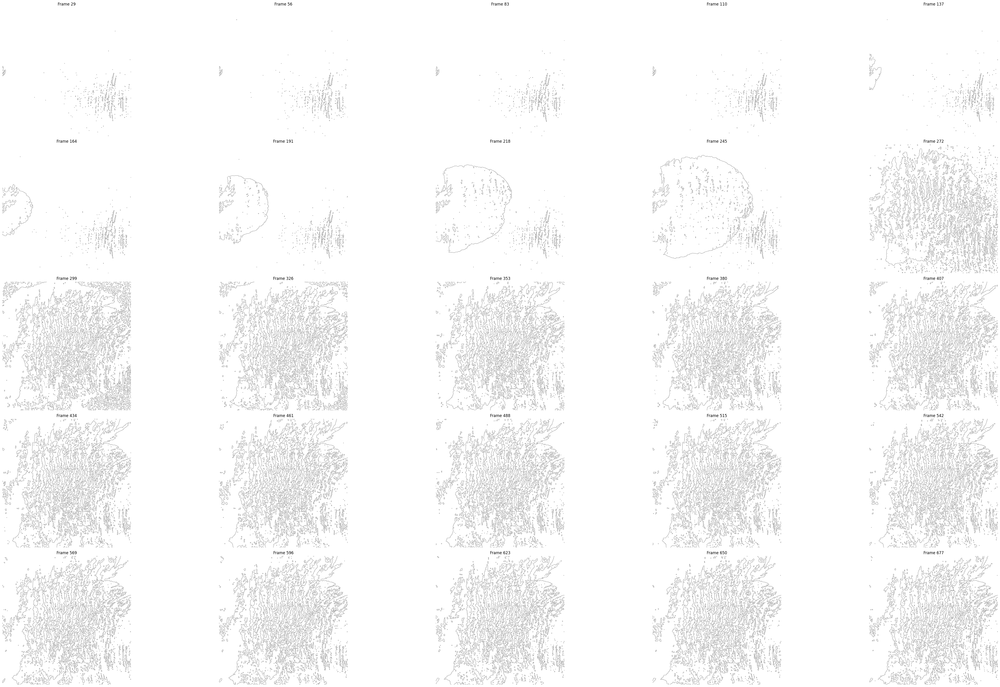

In [ ]:

cap = cv2.VideoCapture(video_path)
bg_ret, bg_frame = cap.read()
bg_gray = cv2.cvtColor(bg_frame, cv2.COLOR_BGR2GRAY)
bg_blur = cv2.GaussianBlur(bg_gray, (5,5), 0)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_frames = [int(total_frames * i / 26) + 3 for i in range(1, 26)]
fig, axes = plt.subplots(5, 5, figsize=(50, 30))
axes = axes.flatten()

for i, frame_num in enumerate(sample_frames):
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    ret, frame = cap.read()
    if ret:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        blur = cv2.GaussianBlur(gray, (5,5), 0)
        diff = cv2.absdiff(bg_blur, blur)
        _, thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)
        kernel = np.ones((3,3), np.uint8)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
        edges = cv2.Canny(thresh, 10, 50)
        edges_inv = cv2.bitwise_not(edges)
        axes[i].imshow(edges_inv, cmap='gray')
        axes[i].set_title(f'Frame {frame_num}')
        axes[i].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "edge.png"), dpi=150, bbox_inches='tight')
plt.show()
cap.release()

In [ ]:
# 生成视频
cap2 = cv2.VideoCapture(video_path)
total_frames = int(cap2.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap2.get(cv2.CAP_PROP_FPS)
w = int(cap2.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap2.get(cv2.CAP_PROP_FRAME_HEIGHT))

bg_ret, bg_frame = cap2.read()
bg_gray = cv2.cvtColor(bg_frame, cv2.COLOR_BGR2GRAY)
bg_blur = cv2.GaussianBlur(bg_gray, (5,5), 0)

out = cv2.VideoWriter(
    os.path.join(output_dir, "edge.mp4"),
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps, (w, h)
)

while True:
    ret, frame = cap2.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    diff = cv2.absdiff(bg_blur, blur)
    _, thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)
    kernel = np.ones((3,3), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    edges = cv2.Canny(thresh, 10, 50)
    edges_inv = cv2.bitwise_not(edges)
    edges_bgr = cv2.cvtColor(edges_inv, cv2.COLOR_GRAY2BGR)
    out.write(edges_bgr)

cap2.release()
out.release()
print("视频生成完成")

KeyboardInterrupt: 

# Method 2: CLAHE + Adaptive Thresholding

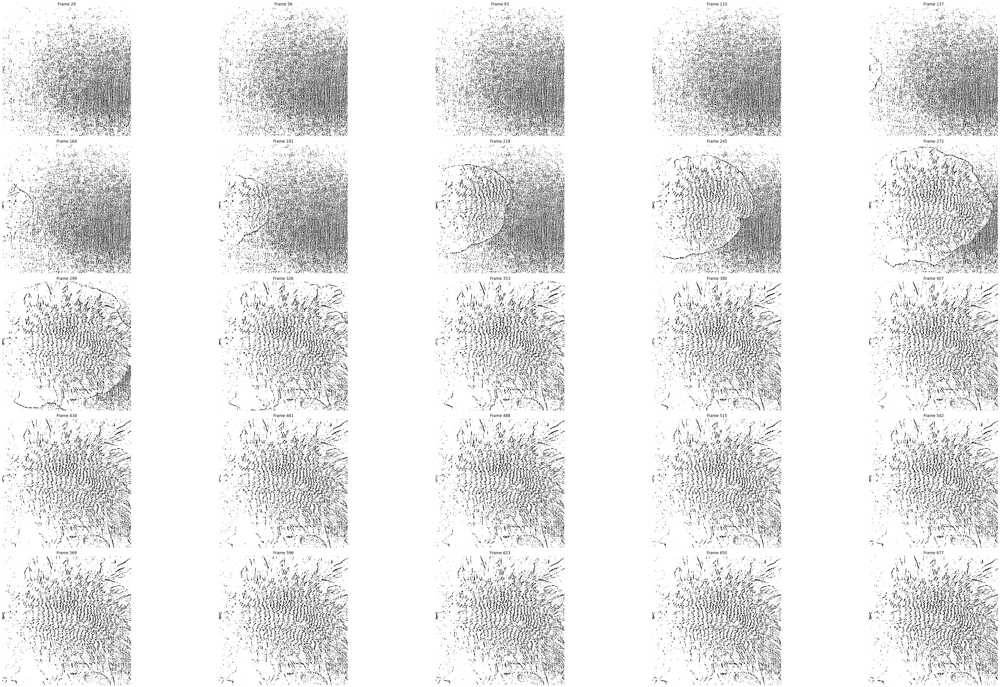

In [ ]:
cap = cv2.VideoCapture(video_path)
cap = cv2.VideoCapture(video_path)
bg_ret, bg_frame = cap.read()
bg_gray = cv2.cvtColor(bg_frame, cv2.COLOR_BGR2GRAY)
bg_blur = cv2.GaussianBlur(bg_gray, (5,5), 0)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_frames = [int(total_frames * i / 26) + 3 for i in range(1, 26)]
fig, axes = plt.subplots(5, 5, figsize=(50, 30))
axes = axes.flatten()

for i, frame_num in enumerate(sample_frames):
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
    ret, frame = cap.read()
    if ret:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8,8))
        enhanced = clahe.apply(gray)
        blur = cv2.GaussianBlur(enhanced, (3,3), 0)
        thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 21, 5)
        kernel = np.ones((2,2), np.uint8)
        thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
        axes[i].imshow(thresh, cmap='gray')
        axes[i].set_title(f'Frame {frame_num}')
        axes[i].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "threshold.png"), dpi=150, bbox_inches='tight')
plt.show()
cap.release()

In [ ]:
cap2 = cv2.VideoCapture(video_path)
total_frames2 = int(cap2.get(cv2.CAP_PROP_FRAME_COUNT))
fps2 = cap2.get(cv2.CAP_PROP_FPS)
w2 = int(cap2.get(cv2.CAP_PROP_FRAME_WIDTH))
h2 = int(cap2.get(cv2.CAP_PROP_FRAME_HEIGHT))

bg_ret2, bg_frame2 = cap2.read()

out2 = cv2.VideoWriter(
    os.path.join(output_dir, "threshold.mp4"),
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps2, (w2, h2)
)

while True:
    ret, frame = cap2.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    blur = cv2.GaussianBlur(enhanced, (3,3), 0)
    thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY, 21, 5)
    kernel = np.ones((2,2), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    thresh_bgr = cv2.cvtColor(thresh, cv2.COLOR_GRAY2BGR)
    out2.write(thresh_bgr)

cap2.release()
out2.release()
print("视频生成完成")

视频生成完成


# Method 3: Space-Time Slicing

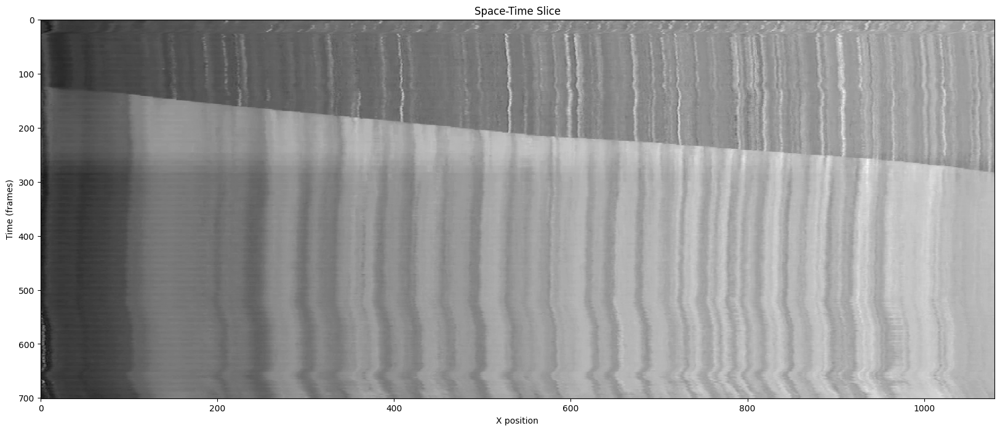

In [ ]:
cap = cv2.VideoCapture(video_path)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
row = 500  # 选哪一行像素，可以改这个数字

slices = []

for _ in range(total_frames):
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    slices.append(gray[row, :])

cap.release()

spacetime = np.array(slices)

plt.figure(figsize=(20, 8))
plt.imshow(spacetime, cmap='gray', aspect='auto')
plt.xlabel('X position')
plt.ylabel('Time (frames)')
plt.title('Space-Time Slice')
plt.savefig(os.path.join(output_dir, "Space-Time Slicing.png"), dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
cap = cv2.VideoCapture(video_path)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
row = 500

slices = []
while True:
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    slices.append(gray[row, :])
cap.release()

w = len(slices[0])
h = len(slices)

out = cv2.VideoWriter(
    os.path.join(output_dir, "spacetime_growing.mp4"),
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps, (w, h)
)

for i in range(1, len(slices)+1):
    canvas = np.zeros((h, w), dtype=np.uint8)
    canvas[:i, :] = np.array(slices[:i])
    canvas_bgr = cv2.cvtColor(canvas, cv2.COLOR_GRAY2BGR)
    out.write(canvas_bgr)

out.release()
print("完成")

完成


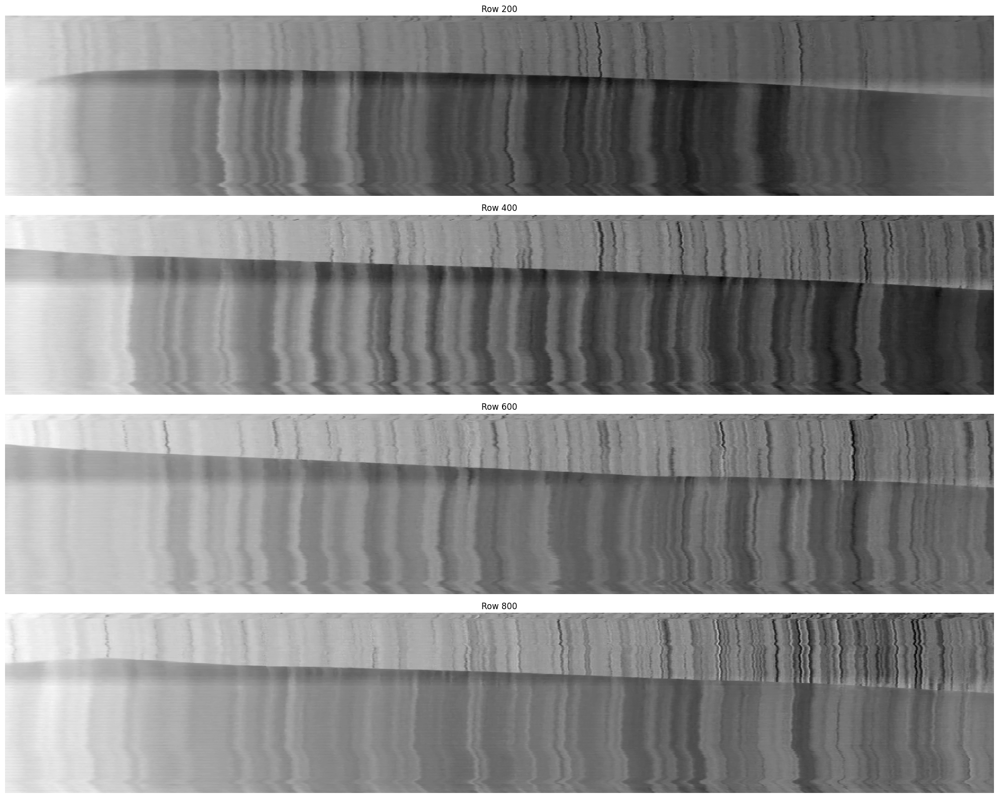

In [ ]:
cap = cv2.VideoCapture(video_path)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

rows = [200, 400, 600, 800]
all_slices = {r: [] for r in rows}

for _ in range(total_frames):
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    for r in rows:
        all_slices[r].append(gray[r, :])

cap.release()

fig, axes = plt.subplots(4, 1, figsize=(20, 16))

for i, r in enumerate(rows):
    spacetime = np.array(all_slices[r])
    axes[i].imshow(255 - spacetime, cmap='gray', aspect='auto')    
    axes[i].set_title(f'Row {r}')
    axes[i].set_ylabel('Time')
    axes[i].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "spacetime_4rows.png"), dpi=150, bbox_inches='tight')
plt.show()


In [ ]:
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

rows = [200, 400, 600, 800]
all_slices = {r: [] for r in rows}

while True:
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    for r in rows:
        all_slices[r].append(gray[r, :])

cap.release()

w = len(all_slices[rows[0]][0])
h = total_frames
out_h = h * 4

out = cv2.VideoWriter(
    os.path.join(output_dir, "spacetime_4rows.mp4"),
    cv2.VideoWriter_fourcc(*'mp4v'),
    fps, (w, out_h)
)

for i in range(1, total_frames + 1):
    canvas = np.zeros((out_h, w), dtype=np.uint8)
    for j, r in enumerate(rows):
        canvas[j*h : j*h+i, :] = np.array(all_slices[r][:i])
    canvas_bgr = cv2.cvtColor(canvas, cv2.COLOR_GRAY2BGR)
    out.write(canvas_bgr)

out.release()
print("完成")

完成


# method 4: Motion History Image, MHI

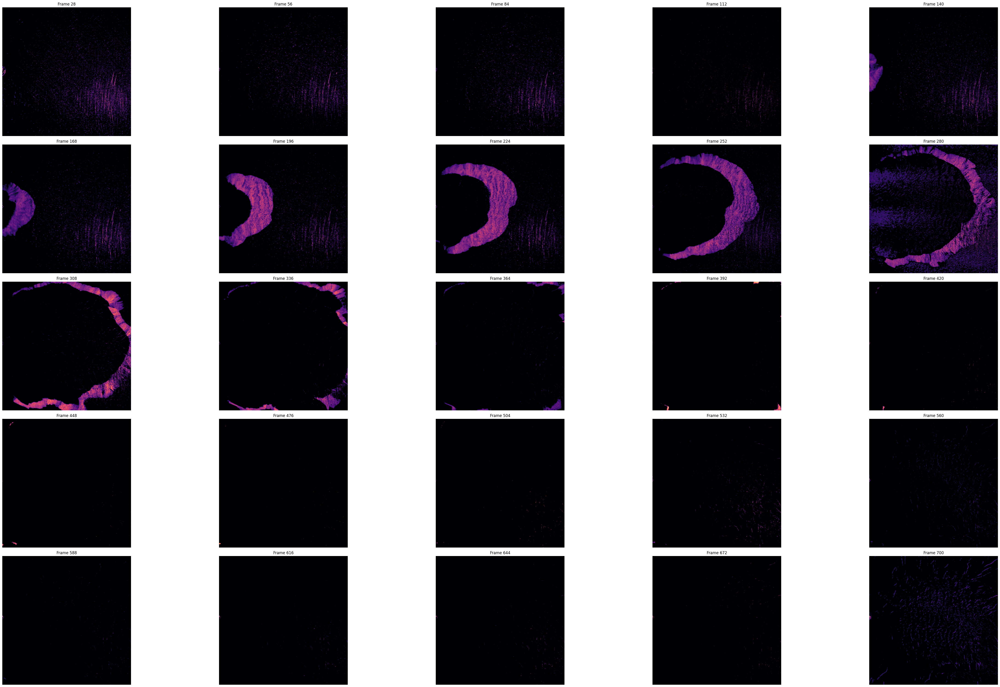

In [ ]:
cap = cv2.VideoCapture(video_path)
ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
sample_every = total_frames // 25

fig, axes = plt.subplots(5, 5, figsize=(50, 30))
axes = axes.flatten()

frame_count = 0
saved = 0

while saved < 25:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1
    if frame_count % sample_every != 0:
        continue
    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    diff = cv2.absdiff(prev_gray, gray)
    _, mag_norm = cv2.threshold(diff, 15, 255, cv2.THRESH_TOZERO)
    
    axes[saved].imshow(mag_norm, cmap='magma')
    axes[saved].set_title(f'Frame {frame_count}')
    axes[saved].axis('off')
    
    prev_gray = gray
    saved += 1

cap.release()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "Motion History Image.png"), dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Export motion difference video

cap = cv2.VideoCapture(video_path)

ret, prev_frame = cap.read()
prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

video_out = os.path.join(output_dir, "method4_Motion History Image.mp4")

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
writer = cv2.VideoWriter(video_out, fourcc, fps, (width, height))

while True:
    ret, frame = cap.read()
    if not ret:
        break

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    diff = cv2.absdiff(prev_gray, gray)
    _, mag_norm = cv2.threshold(diff, 15, 255, cv2.THRESH_TOZERO)

    # 转成彩色方便写入视频
    mag_color = cv2.applyColorMap(mag_norm, cv2.COLORMAP_MAGMA)

    writer.write(mag_color)

    prev_gray = gray

cap.release()
writer.release()

print(f"Saved: {video_out}")

Saved: C:\Users\xiaoh\OneDrive\Desktop\Final_morphogenesis\09_experiments\previous_tests\01_material_analysis\output\ice_crystal_01\analysis\method4_Motion History Image.mp4
